# ROTATION

### IC

In [1]:
#Hamiltonian
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
def HamiltonianRHS(vec, t):
    dvecdt = np.zeros_like(vec)
    z=vec[2]
    dvecdt[0:3] = vec[3:]/m
    dvecdt[3:5] = -m*(w**2-lambd*z)*vec[0:2]
    dvecdt[5] = -m*(4*w**2*z-0.5*lambd*(vec[0]**2+vec[1]**2))
    return dvecdt

In [2]:
#112
def RHS(u,t,w):
    """For 1:1:2 resonance"""
    lambd = 3*np.pi**2
    dydt = np.zeros(6)
    x = u[0]
    y = u[2]
    z = u[4]
    dydt[0] = u[1]
    dydt[1] = lambd*x*z-x*w**2+2*R*u[3]
    dydt[2] = u[3]
    dydt[3] = lambd*y*z-y*w**2-2*R*u[1]
    dydt[4] = u[5]
    dydt[5] = lambd/2*(x**2+y**2)-4*w**2*z
    return dydt

R = 7.29*10**(-5)*2

%pylab inline
from scipy.integrate import odeint
y0d = 0.00489
x0 = 0.012
z0 = 0.012
ic = (x0,0,0,y0d,z0,0)
ic2 = (x0,0,z0,0,y0d,0)
w = np.pi
l= 1
g = np.pi**2
k = np.pi**2*4
m = 1
l_0 = 3/4*l
lambd = l_0*4*w**2/l
T = 800
t = np.linspace(0,T,800/0.002+1)
u1 = odeint(RHS,ic,t,args=(w,),atol=0.00000000001)
u2= odeint(HamiltonianRHS, ic2 ,t, atol=0.000000001)
x = u1[:,0]
y = u1[:,2]
z = u1[:,4]
x2 = u2[:,0]
y2 = u2[:,1]
z2 = u2[:,2]
print('Equations solved')
plt.figure(figsize=(10,10))
plt.plot(x,y,linewidth=0.3,label='Original')
plt.plot(x2,y2,linewidth=0.3,label='Ham')
plt.grid()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Stepwise precession of the swing plane')
plt.legend()
plt.show()

Populating the interactive namespace from numpy and matplotlib


TypeError: 'float' object cannot be interpreted as an integer

## Deterministic setting - Foucault, T=320

0.002


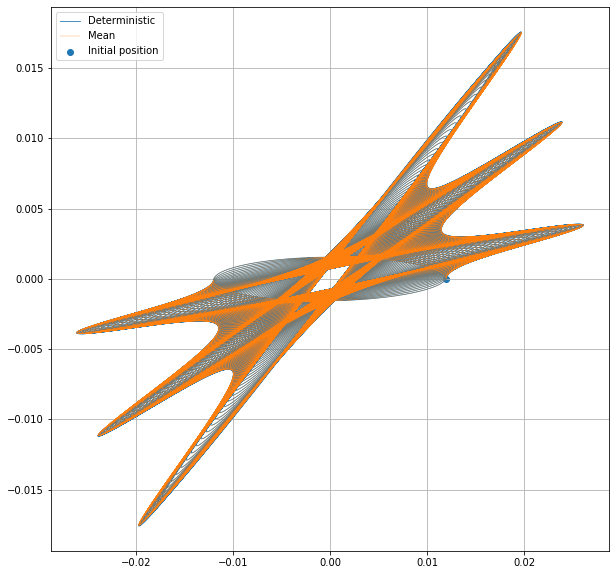

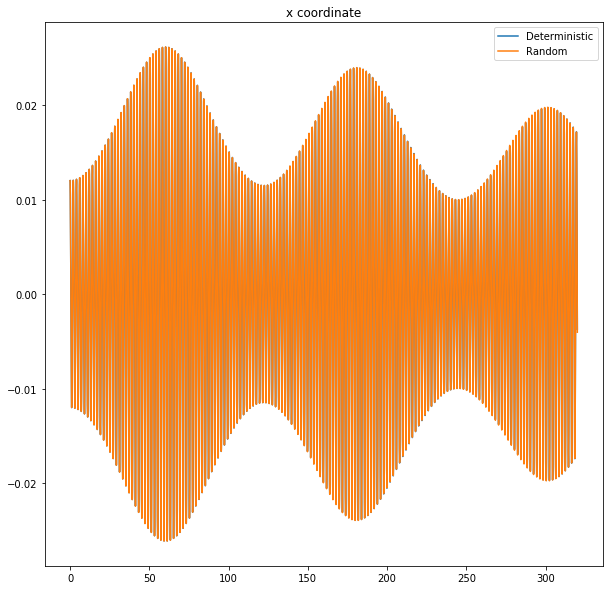

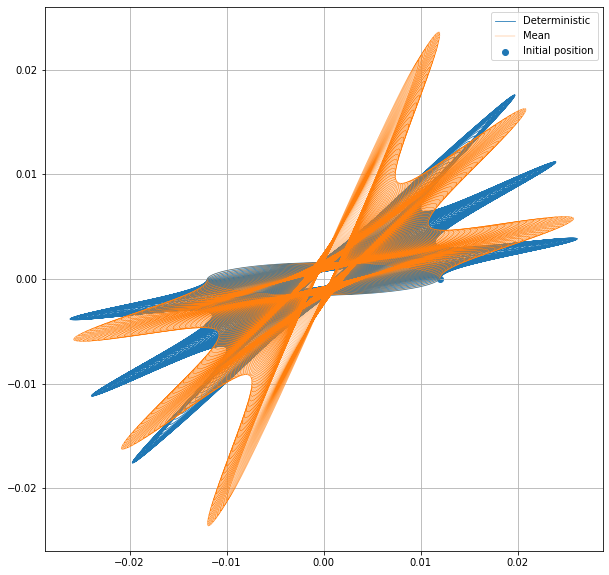

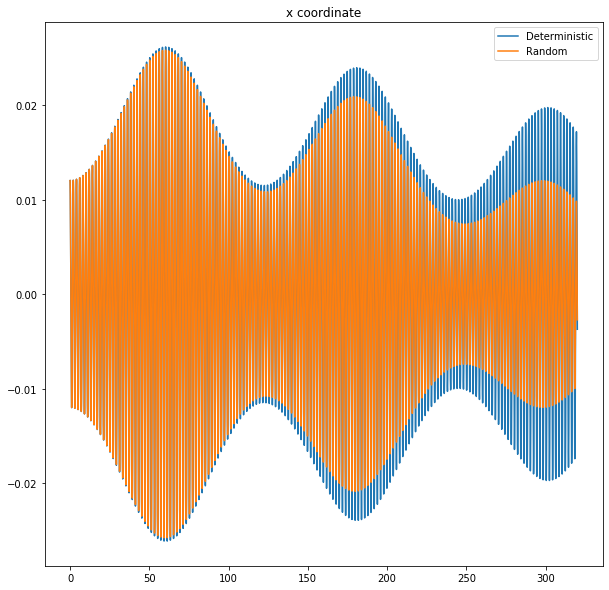

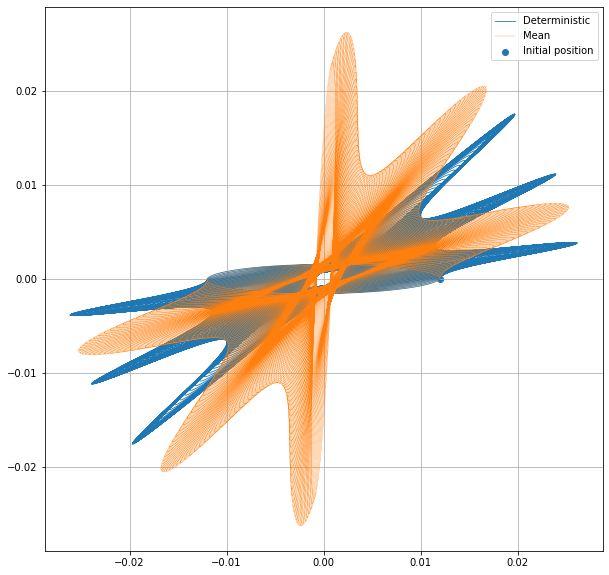

...

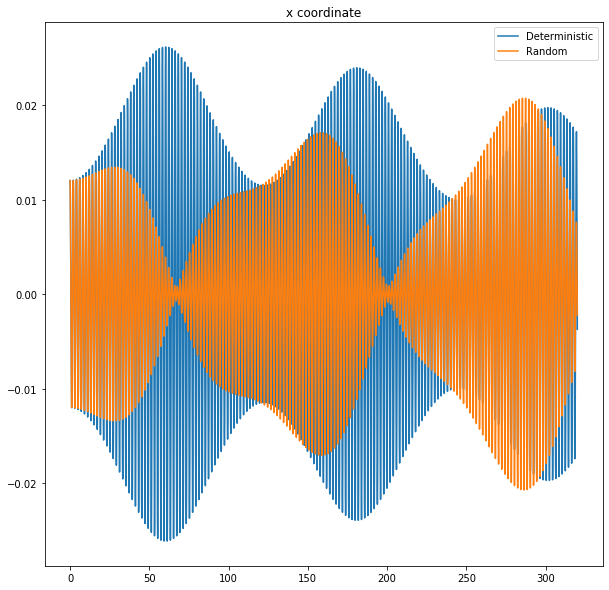

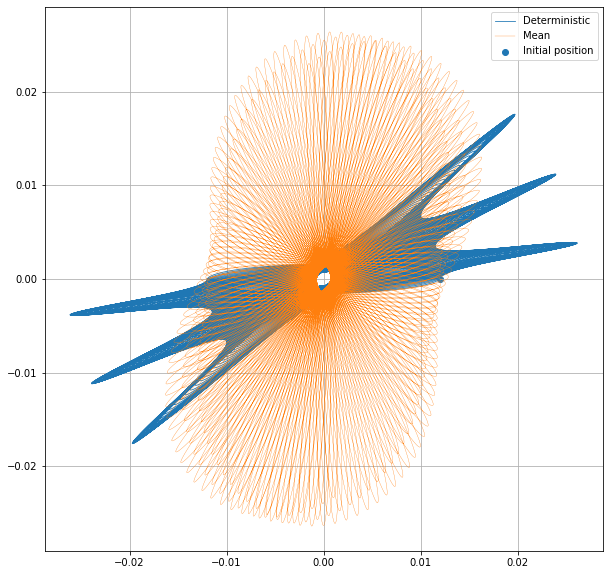

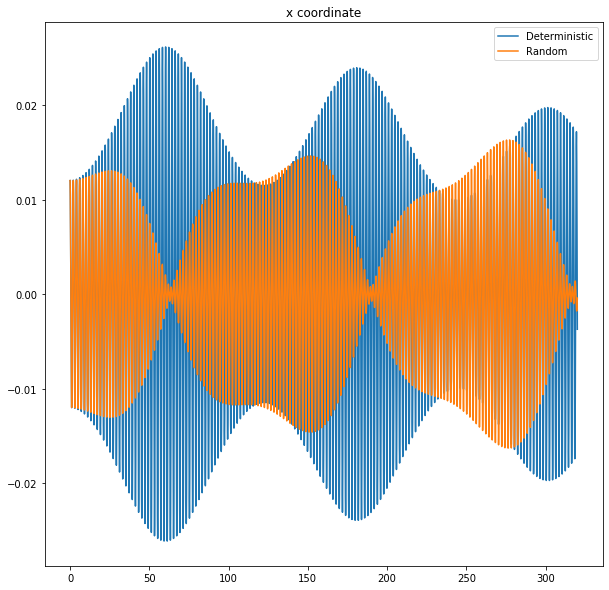

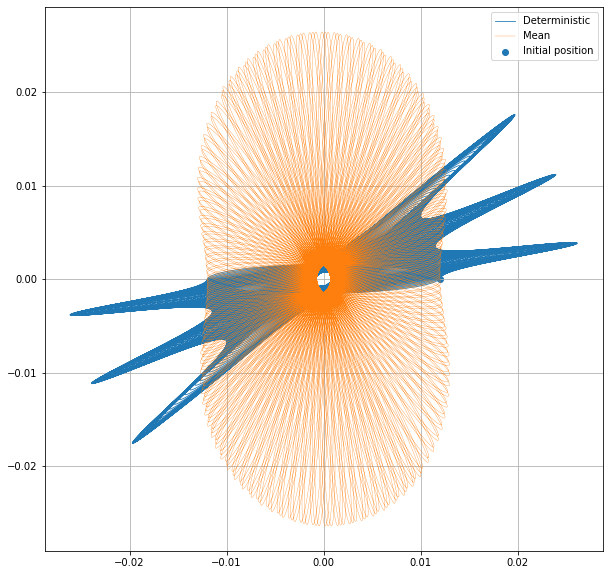

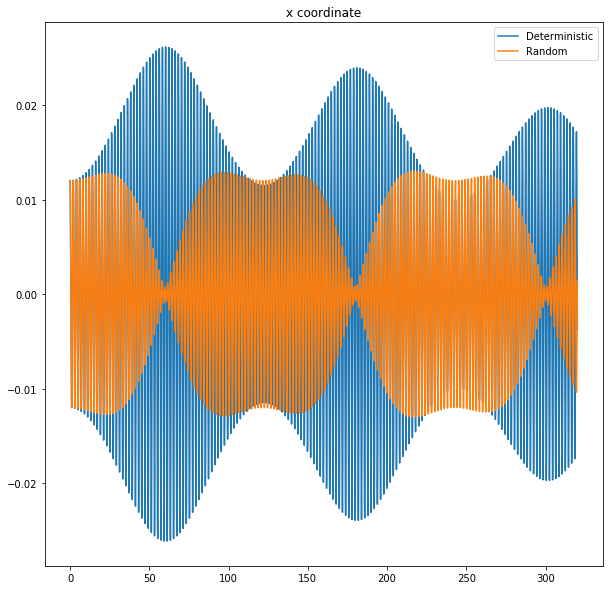

In [9]:
#Range-kutta
permutation_mat = np.array([[0,-1,0,0,0,0],[1,0,0,0,0,0],[0,0,0,0,0,0],[0,0,0,0,-1,0],[0,0,0,1,0,0],[0,0,0,0,0,0]])
T = 320
t0 = int(320/0.002+1)
t1 = np.linspace(0,T,t0)
u2= odeint(HamiltonianRHS, ic2 ,t1, atol=0.000000001)
n = t0
t = np.linspace(0,T,n)

h=t[1]-t[0]
dt=h
print(h)
sqrh=np.sqrt(h)
def L_val(vec, t):
    return permutation_mat@vec/m*sigma
    #return sigma


sig_vec = np.arange(0, 0.00005, 0.0000025)
std_vec = np.zeros((len(sig_vec),3))
j = 0


for sigma in sig_vec:
    plt.figure(figsize(10,10))
    plt.scatter(ic2[0],ic2[1], label='Initial position')
    plt.plot(u2[:,0],u2[:,1], linewidth =0.8, label='Deterministic')
    mean_path = np.zeros((n, 6))
    S=np.array([-1,1])
    #Iteration
    u = np.zeros((n, 6))
    u[0,:] = ic2
    for i in range(n-1):
        vec = u[i,:]
        S_k = np.random.choice(S)
        K_1 = h*HamiltonianRHS(vec, i) + L_val(vec, i)*h
        K_2 = h*HamiltonianRHS(vec+K_1,i) + L_val(vec+K_1,i)*h
        u[i+1,:] = vec +0.5*(K_1+K_2)
    xr = u[:,0]
    yr = u[:,1]
    mean_path += u

    x_m = mean_path[:,0]
    y_m = mean_path[:,1]
    z_m = mean_path[:,2]
    xstd= np.sqrt(sum((x_m-u2[:,0])**2))
    ystd= np.sqrt(sum((y_m-u2[:,1])**2))
    zstd= np.sqrt(sum((z_m-u2[:,2])**2))
    std_vec[j][0] = xstd
    std_vec[j][1] = ystd
    std_vec[j][2] = zstd
    #print("stdx=",xstd)
    #print("stdy=",ystd)
    #print("stdz=",zstd)
    plt.plot(x_m,y_m, label='Mean', linewidth=0.3)
    plt.grid()
    plt.legend()
    plt.show()
    #plt.plot(t1,u2[:,2],label='Deterministic')
    #plt.plot(t,z_m, label='Random')
    #plt.title('z coordinate')
    #plt.legend()
    #plt.show()
    plt.plot(t1,u2[:,0],label='Deterministic')
    plt.plot(t,x_m, label='Random')
    plt.title('x coordinate')
    plt.legend()
    plt.show()
    #plt.plot(t1,u2[:,1],label='Deterministic')
    #plt.plot(t,y_m, label='Random')
    j +=1

## Stochastic analysis on 112

T = 160 (two lines), takes a while but results already storaged 

0.002


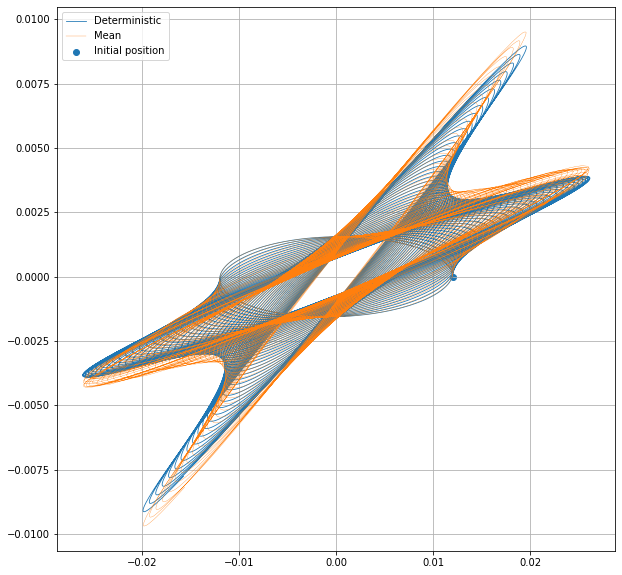

0.002


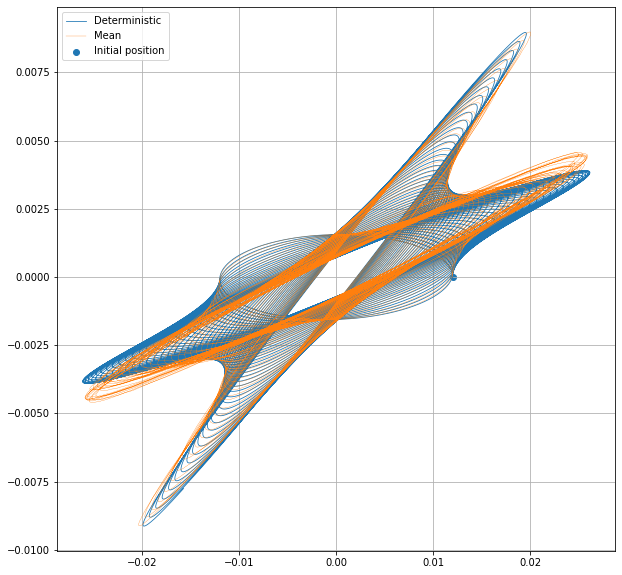

0.002


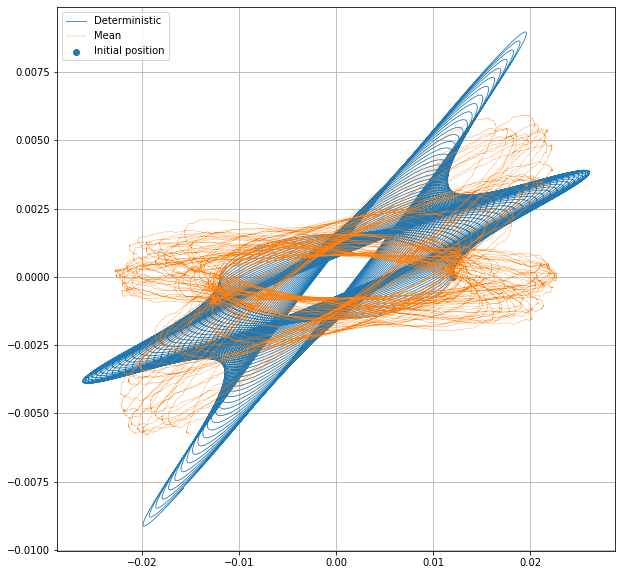

0.002


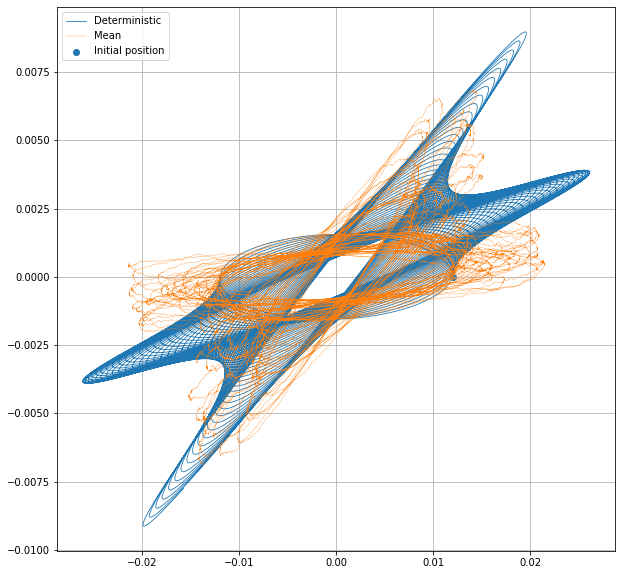

In [18]:
#Range-kutta
np.random.seed(674)
permutation_mat = np.array([[0,-1,0,0,0,0],[1,0,0,0,0,0],[0,0,0,0,0,0],[0,0,0,0,-1,0],[0,0,0,1,0,0],[0,0,0,0,0,0]])
N_simulations = 50

det_results = []
results = []

T = 160
    
t0 = 0.002
t1 = np.linspace(0,T,int(T/t0+1))
u2= odeint(HamiltonianRHS, ic2 ,t1, atol=0.000000001)
n = int(T/t0+1)
t = np.linspace(0,T,n)
det_results.append(u2[:,0])
det_results.append(u2[:,1])
det_results.append(u2[:,2])

for sigma in [0.01,0.02,0.1,0.125]:
    res1 = []
    h=t[1]-t[0]
    dt=h
    print(h)
    sqrh=np.sqrt(h)
    def dW(delta_t):
        """Sample a random number at each call."""
        return np.random.normal(loc = 0.0, scale = np.sqrt(delta_t))
    def L_val(vec, t):
        return permutation_mat@vec/m*sigma

    mean_path = np.zeros((n, 6))
    S=np.array([-1,1])

    #Iteration
    for _ in range(N_simulations):
        u = np.zeros((n, 6))
        u[0,:] = ic2
        for i in range(n-1):
            vec = u[i,:]
            S_k = np.random.choice(S)
            dW_t= dW(dt)
            K_1 = h*HamiltonianRHS(vec, i) + (dW_t-S_k*sqrh)*L_val(vec, i)
            K_2 = h*HamiltonianRHS(vec+K_1,i) + (dW_t+S_k*sqrh)*L_val(vec+K_1,i)
            u[i+1,:] = vec +0.5*(K_1+K_2)
        xr = u[:,0]
        yr = u[:,1]
        mean_path += u
        #print(f'Simulation {_}')

    x_m = mean_path[:,0]/N_simulations
    y_m = mean_path[:,1]/N_simulations
    z_m = mean_path[:,2]/N_simulations
    res1.append(x_m)
    res1.append(y_m)
    res1.append(z_m)
    results.append(res1)

    plt.figure(figsize(10,10))
    plt.scatter(ic2[0],ic2[1], label='Initial position')
    plt.plot(u2[:,0],u2[:,1], linewidth =0.8, label='Deterministic')
    plt.plot(x_m,y_m, label='Mean', linewidth=0.3)
    plt.grid()
    plt.legend()
    plt.show()
    #plt.plot(t1,u2[:,2],label='Deterministic')
    #plt.plot(t,z_m, label='Random')
    #plt.title('z coordinate')
    #plt.legend()
    #plt.show()
    #plt.plot(t1,u2[:,0],label='Deterministic')
    #plt.plot(t,x_m, label='Random')
    #plt.title('x coordinate')
    #plt.legend()
    #plt.show()

In [ ]:
plt.results

In [24]:
# open a binary file in write mode
file = open("res1601", "wb")
# save array to the file
np.save(file, results)
# close the file
file.close
# open a binary file in write mode
file = open("resdet1601", "wb")
# save array to the file
np.save(file, det_results)
# close the file
file.close

<function BufferedWriter.close>

In [ ]:
#Range-kutta
np.random.seed(674)
permutation_mat = np.array([[0,-1,0,0,0,0],[1,0,0,0,0,0],[0,0,0,0,0,0],[0,0,0,0,-1,0],[0,0,0,1,0,0],[0,0,0,0,0,0]])
N_simulations = 50

det_results = []
results = []

T = 320
    
t0 = 0.002
t1 = np.linspace(0,T,int(T/t0+1))
u2= odeint(HamiltonianRHS, ic2 ,t1, atol=0.000000001)
n = int(T/t0+1)
t = np.linspace(0,T,n)
det_results.append(u2[:,0])
det_results.append(u2[:,1])
det_results.append(u2[:,2])

for sigma in [0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.125,0.15,0.175,0.2]:
    res1 = []
    h=t[1]-t[0]
    dt=h
    print(h)
    sqrh=np.sqrt(h)
    def dW(delta_t):
        """Sample a random number at each call."""
        return np.random.normal(loc = 0.0, scale = np.sqrt(delta_t))
    def L_val(vec, t):
        return permutation_mat@vec/m*sigma

    mean_path = np.zeros((n, 6))
    S=np.array([-1,1])

    #Iteration
    for _ in range(N_simulations):
        u = np.zeros((n, 6))
        u[0,:] = ic2
        for i in range(n-1):
            vec = u[i,:]
            S_k = np.random.choice(S)
            dW_t= dW(dt)
            K_1 = h*HamiltonianRHS(vec, i) + (dW_t-S_k*sqrh)*L_val(vec, i)
            K_2 = h*HamiltonianRHS(vec+K_1,i) + (dW_t+S_k*sqrh)*L_val(vec+K_1,i)
            u[i+1,:] = vec +0.5*(K_1+K_2)
        xr = u[:,0]
        yr = u[:,1]
        mean_path += u
        #print(f'Simulation {_}')

    x_m = mean_path[:,0]/N_simulations
    y_m = mean_path[:,1]/N_simulations
    z_m = mean_path[:,2]/N_simulations
    res1.append(x_m)
    res1.append(y_m)
    res1.append(z_m)
    results.append(res1)

    plt.figure(figsize(10,10))
    plt.scatter(ic2[0],ic2[1], label='Initial position')
    plt.plot(u2[:,0],u2[:,1], linewidth =0.8, label='Deterministic')
    plt.plot(x_m,y_m, label='Mean', linewidth=0.3)
    plt.grid()
    plt.legend()
    plt.show()
    #plt.plot(t1,u2[:,2],label='Deterministic')
    #plt.plot(t,z_m, label='Random')
    #plt.title('z coordinate')
    #plt.legend()
    #plt.show()
    #plt.plot(t1,u2[:,0],label='Deterministic')
    #plt.plot(t,x_m, label='Random')
    #plt.title('x coordinate')
    #plt.legend()
    #plt.show()

0.002


In [ ]:
# open a binary file in write mode
file = open("res3201", "wb")
# save array to the file
np.save(file, results)
# close the file
file.close
# open a binary file in write mode
file = open("resdet3201", "wb")
# save array to the file
np.save(file, det_results)
# close the file
file.close

In [ ]:
results160 = np.load('res160')

# Data is printed from geekfile.npy
print("The data is printed from npfile.npy")

det_results160 = np.load('resdet160')

# Data is printed from geekfile.npy
print("The data is printed from npfile.npy")

results320 = np.load('res320')

# Data is printed from geekfile.npy
print("The data is printed from npfile.npy")

det_results320 = np.load('resdet320')

# Data is printed from geekfile.npy
print("The data is printed from npfile.npy")

C:\Users\piatt\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in square
  after removing the cwd from sys.path.


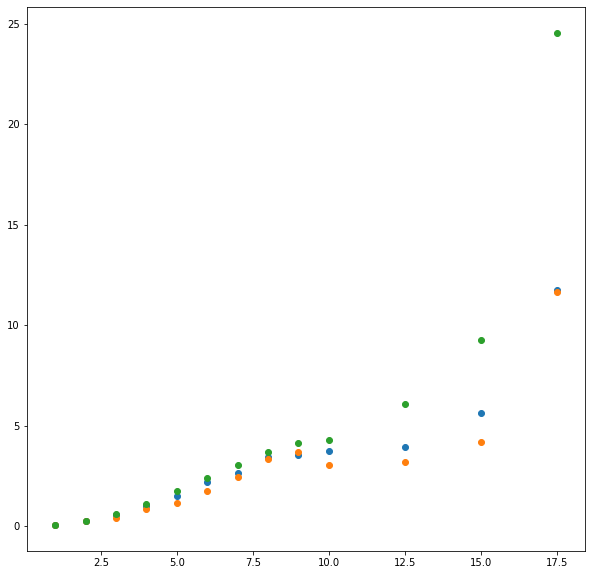

In [15]:
std_vec160 = np.zeros((3,14))
for j in range(3):
    for i in range(14):
        std_vec160[j][i] = np.sqrt(sum((results[i][j]-det_results[j])**2))
    
sig_vec = np.array([0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.125,0.15,0.175,0.2])    
plt.figure(figsize=(10,10))
for j in range(3):
    plt.scatter(sig_vec*100, std_vec160[j], label=j)
plt.show()

In [20]:
print(results160)

[[ 1.20000000e-02  1.19997717e-02  1.19990866e-02 ... -1.58910304e-02
  -1.58150419e-02 -1.57384186e-02]
 [ 0.00000000e+00  9.77993533e-06  1.95595013e-05 ... -7.81329889e-03
  -7.78332211e-03 -7.75303296e-03]
 [ 1.20000000e-02  1.19990568e-02  1.19962273e-02 ... -5.45984517e-03
  -5.52581650e-03 -5.59089685e-03]]


### Precession Angle Analysis

In [19]:
sig_list = [0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.125,0.15,0.175,0.2]
for sig in range(14):

    xd = results160[sig][0]
    yd = results160[sig][1]
    angle_list = []
    time = []

    distance_arr = np.sqrt(xd**2+yd**2)

    for i in range(len(distance_arr)):
        if distance_arr[i] >=0.018:
            time.append(i)
            angle_list.append(np.arctan(yd[i]/xd[i]))
    
    time_fin = np.array(time)*0.002
    lab = sig_list[sig]
    angle_arr = np.array(angle_list)
    plt.figure(figsize=(18,18))
    #t = np.linspace(0, 160, len(angle_arr))
    plt.scatter(time_fin, angle_arr, label = lab)
    plt.legend()
    plt.show()

TypeError: object of type 'numpy.float64' has no len()

In [ ]:
xd = det_results160[0]
yd = det_results160[1]
angle_list = []
time = []

distance_arr = np.sqrt(xd**2+yd**2)

for i in range(len(distance_arr)):
    if distance_arr[i] >=0.018:
        time.append(i)
        angle_list.append(np.arctan(yd[i]/xd[i]))

time_fin = np.array(time)*0.002
#lab = sig_list[sig]
angle_arr = np.array(angle_list)
plt.figure(figsize=(18,18))
#t = np.linspace(0, 160, len(angle_arr))
plt.scatter(time_fin, angle_arr)
plt.show()

In [ ]:
sig_list = [0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.125,0.15,0.175,0.2]
for sig in range(14):

    xd = results160[sig][0]
    yd = results160[sig][1]
    angle_list = []
    time = []

    distance_arr = np.sqrt(xd**2+yd**2)

    for i in range(len(distance_arr)):
        if distance_arr[i] >=0.018:
            time.append(i)
            angle_list.append(np.arctan(yd[i]/xd[i]))
    
    time_fin = np.array(time)*0.002
    lab = sig_list[sig]
    angle_arr = np.array(angle_list)
    plt.figure(figsize=(18,18))
    #t = np.linspace(0, 160, len(angle_arr))
    plt.scatter(time_fin, angle_arr, label = lab)
    plt.legend()
    plt.show()

In [ ]:
xd = det_results320[0]
yd = det_results320[1]
angle_list = []
time = []

distance_arr = np.sqrt(xd**2+yd**2)

for i in range(len(distance_arr)):
    if distance_arr[i] >=0.018:
        time.append(i)
        angle_list.append(np.arctan(yd[i]/xd[i]))

time_fin = np.array(time)*0.002
#lab = sig_list[sig]
angle_arr = np.array(angle_list)
plt.figure(figsize=(18,18))
#t = np.linspace(0, 160, len(angle_arr))
plt.scatter(time_fin, angle_arr)
plt.show()

In [ ]:
print(results)